# 🚀 Train MobileNetV2 Classifier and Export to TFLite
This notebook trains a MobileNetV2 image classifier using Keras, then exports it to `.tflite` format for deployment (e.g., on Fischertechnik TXT 4.0).

In [ ]:
# ✅ Install dependencies
!pip install tensorflow matplotlib scikit-learn


In [1]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.17.0


In [4]:
dataset_dir = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\boho_dataset"
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"


In [5]:
# 🏷️ Read class names
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]
print("Classes:", class_names)


Classes: ['BLANK', 'BOHO', 'BOHOEL', 'BOHOMIPO1', 'BOHOMIPO2', 'CRACK', 'MIPO1', 'MIPO2']


In [8]:
import os
import shutil

# Path to your flat dataset folder
dataset_dir = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\boho_dataset"

# Create subfolders and move images
for filename in os.listdir(dataset_dir):
    if filename.endswith(".jpeg") or filename.endswith(".jpg") or filename.endswith(".png"):
        # Example: cam320x240-BOHO-1665...jpeg → get 'BOHO'
        parts = filename.split('-')
        if len(parts) >= 3:
            class_label = parts[1]
            class_dir = os.path.join(dataset_dir, class_label)

            # Create subfolder if not exists
            os.makedirs(class_dir, exist_ok=True)

            # Move image to class subfolder
            src = os.path.join(dataset_dir, filename)
            dst = os.path.join(class_dir, filename)
            shutil.move(src, dst)

print("✅ Images moved into class folders successfully.")


✅ Images moved into class folders successfully.


In [9]:
# 🧹 Prepare dataset using ImageDataGenerator
img_size = (224, 224)
batch_size = 32

datagen = ImageDataGenerator(
    validation_split=0.2,
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

train_gen = datagen.flow_from_directory(
    dataset_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

val_gen = datagen.flow_from_directory(
    dataset_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)


Found 635 images belonging to 8 classes.
Found 155 images belonging to 8 classes.


In [10]:
# 🧠 Build MobileNetV2 classifier
base_model = MobileNetV2(input_shape=img_size + (3,), include_top=False, weights='imagenet')
base_model.trainable = False

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(class_names), activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,984 (9.24 MB)

 Trainable params: 165,000 (644.53 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [11]:
# 🏋️ Train the model
epochs = 10
history = model.fit(train_gen, validation_data=val_gen, epochs=epochs)


c:\Users\anar1\anaconda3\envs\tf39\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.3385 - loss: 1.9256 - val_accuracy: 0.7548 - val_loss: 0.8700
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.7223 - loss: 0.7919 - val_accuracy: 0.7935 - val_loss: 0.6250
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.8195 - loss: 0.5520 - val_accuracy: 0.8774 - val_loss: 0.4536
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.8924 - loss: 0.4080 - val_accuracy: 0.8645 - val_loss: 0.4207
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.8833 - loss: 0.3390 - val_accuracy: 0.8645 - val_loss: 0.4213
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.8859 - loss: 0.3352 - val_accuracy: 0.9419 - val_loss: 0.2806
Epoch 7/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.9499 - loss: 0.2449 - val_accuracy: 0.9161 - val_loss: 0.2695
Epoch 8/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9510 - loss: 0.2218 - val_accuracy: 0.9161 - val_loss:

In [12]:
# 💾 Save the model as .h5
model.save("mobilenet_classifier.h5")
print("Model saved as mobilenet_classifier.h5")


Model saved as mobilenet_classifier.h5


In [13]:
# 🔄 Convert to .tflite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open("mobilenet_classifier.tflite", "wb") as f:
    f.write(tflite_model)

print("Model exported to mobilenet_classifier.tflite")


INFO:tensorflow:Assets written to: C:\Users\anar1\AppData\Local\Temp\tmprgldwih1\assets


INFO:tensorflow:Assets written to: C:\Users\anar1\AppData\Local\Temp\tmprgldwih1\assets


Saved artifact at 'C:\Users\anar1\AppData\Local\Temp\tmprgldwih1'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 8), dtype=tf.float32, name=None)
Captures:
  2471512361440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471051333872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471512186720: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471512362672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471090195088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471512183024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471512112112: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471512112464: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471512111408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2471512111760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2

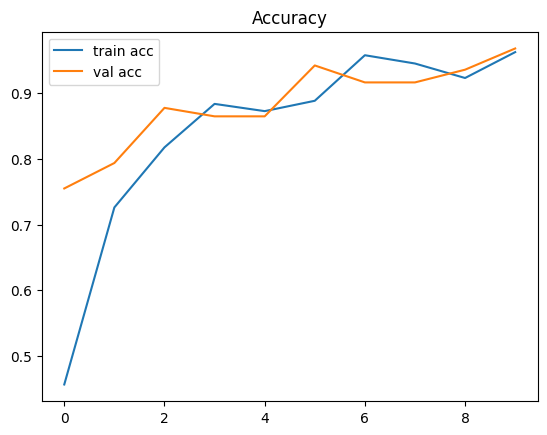

In [14]:
# 📈 Optional: Plot training history
plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.legend()
plt.title("Accuracy")
plt.show()


# TEST MANUALLY #1
### testing/predicting a folder of images

In [19]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import pandas as pd

# === CONFIGURATION ===
model_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\mobilenet_classifier.h5"  # Your trained model file
#dataset_dir = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\boho_dataset"
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"

#labels_path = "labels.txt"  # File with class names
unseen_images_dir = r"C:\Users\anar1\Downloads\JULIANIMAGES\OneDrive_6_6-19-2025"  # ← UPDATED PATH
output_csv = "predictions.csv"

# === Load labels ===
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]

# === Load model ===
model = tf.keras.models.load_model(model_path)

# === Preprocessing function ===
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Prediction loop ===
results = []
for file in os.listdir(unseen_images_dir):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(unseen_images_dir, file)
        img_tensor = preprocess_image(img_path)
        preds = model.predict(img_tensor)
        pred_class = class_names[np.argmax(preds)]
        confidence = float(np.max(preds))
        results.append((file, pred_class, confidence))

# === Save results ===
df = pd.DataFrame(results, columns=["Image", "PredictedLabel", "Confidence"])
df.to_csv(output_csv, index=False)
print(f"✅ Predictions saved to {output_csv}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
✅ Predictions saved to predictions.csv


# predictions for BOHOEL (WHITE OVAL)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


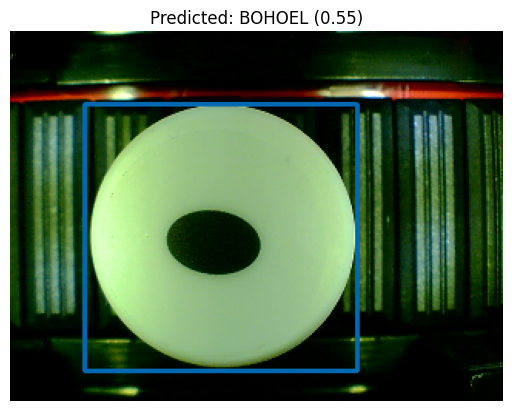

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


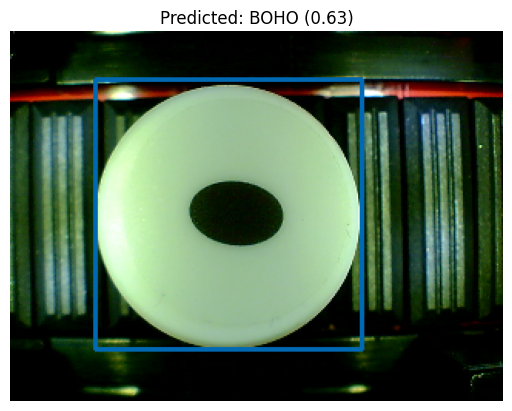

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


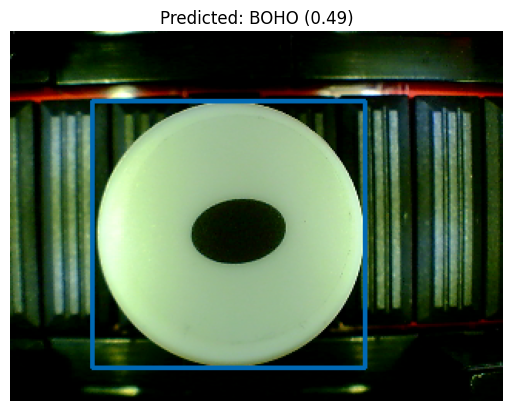

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


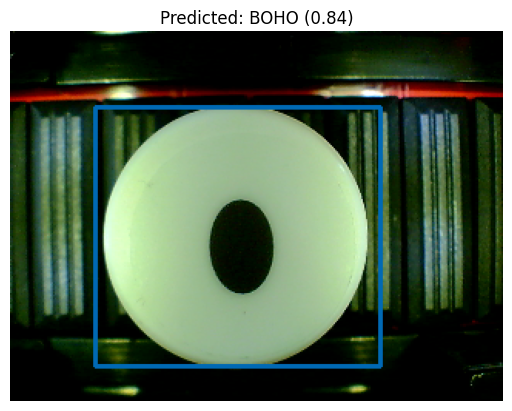

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


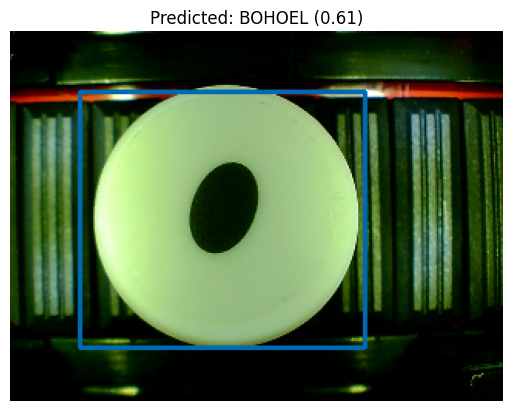

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


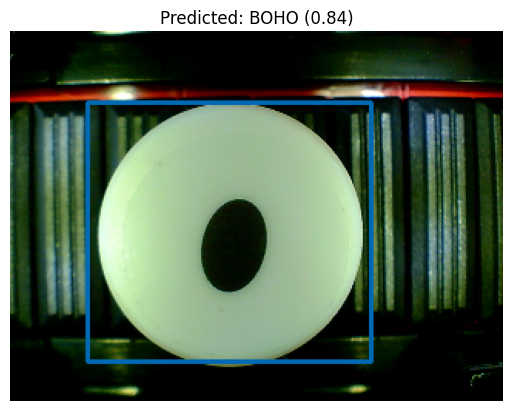

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


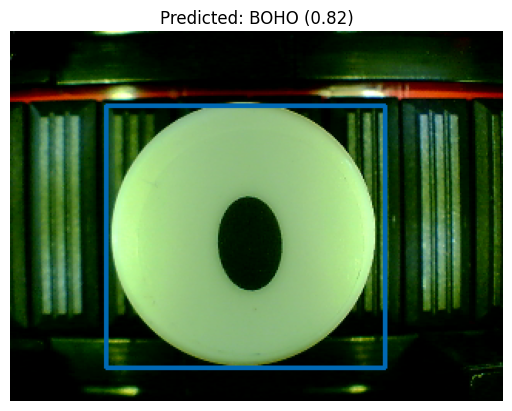

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


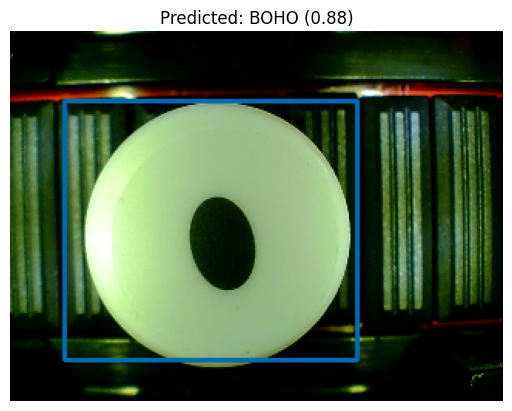

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


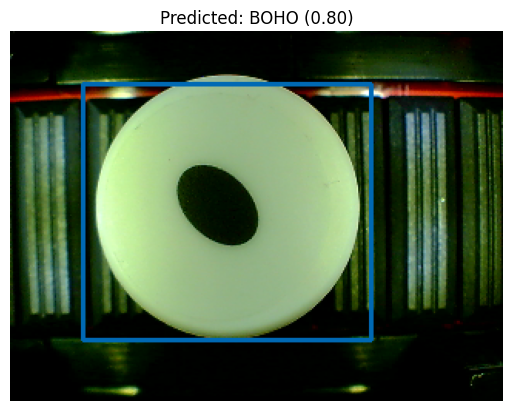

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


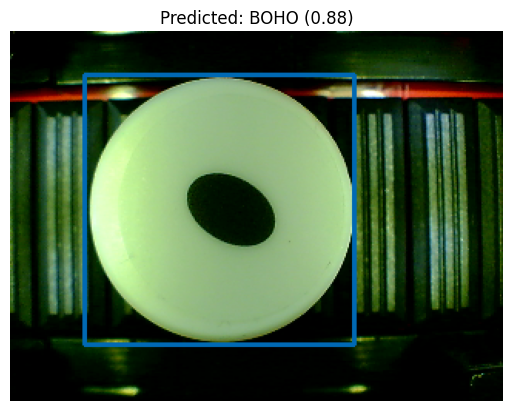

In [21]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image

# === CONFIGURATION ===
model_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\mobilenet_classifier.h5"  # Your trained model file
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"
unseen_images_dir = r"C:\Users\anar1\Downloads\JULIANIMAGES\OneDrive_6_6-19-2025"

# === Load class labels ===
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]

# === Load the model ===
model = tf.keras.models.load_model(model_path)

# === Helper function ===
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Make predictions and visualize ===
for file in os.listdir(unseen_images_dir):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(unseen_images_dir, file)
        
        # Preprocess & predict
        img_tensor = preprocess_image(img_path)
        preds = model.predict(img_tensor)
        pred_class = class_names[np.argmax(preds)]
        confidence = float(np.max(preds))
        
        # Load original image
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {pred_class} ({confidence:.2f})")
        plt.show()


# PREDICTIONS FOR MIPO2 BLUE

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


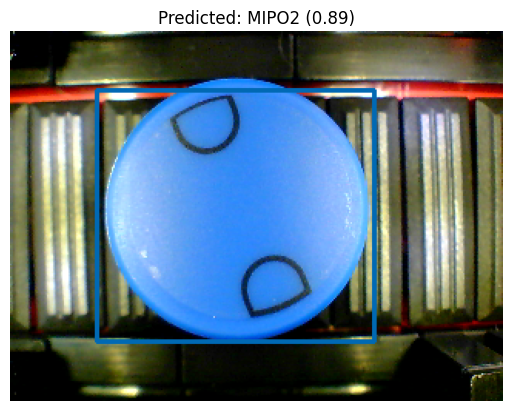

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


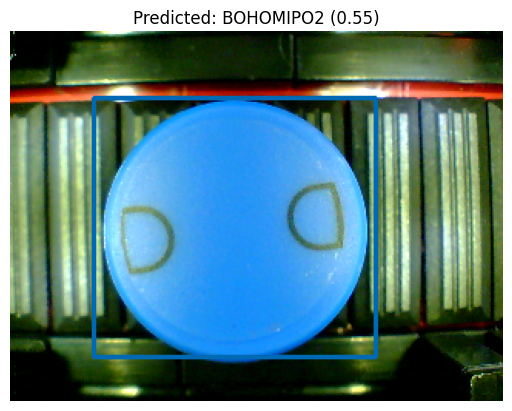

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


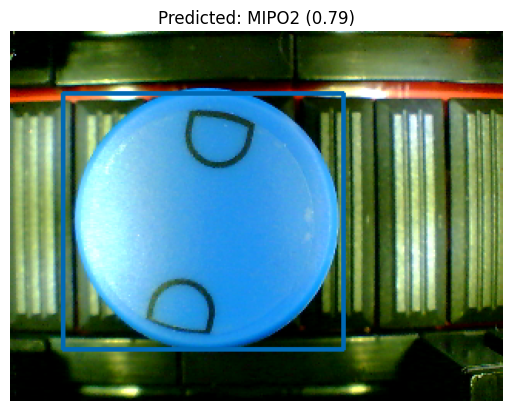

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


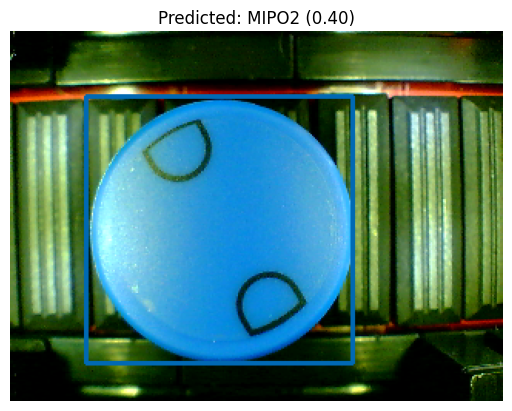

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


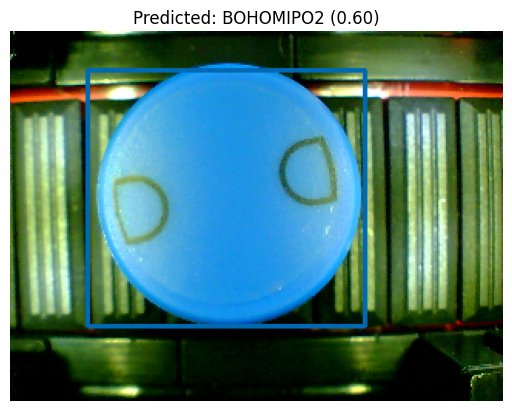

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


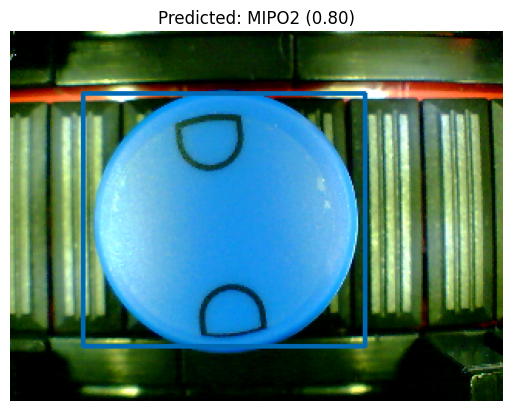

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


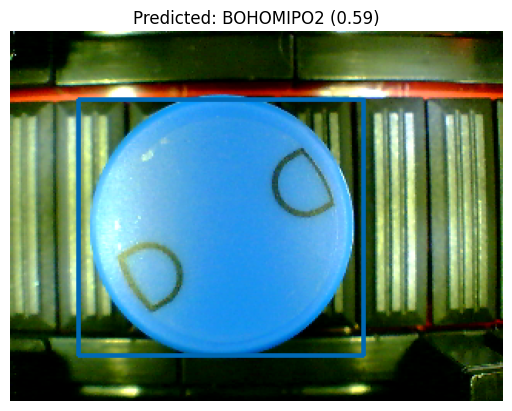

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


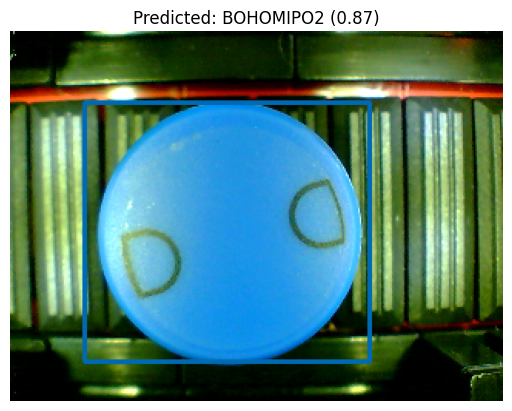

In [22]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image

# === CONFIGURATION ===
model_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\mobilenet_classifier.h5"  # Your trained model file
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"
unseen_images_dir = r"C:\Users\anar1\Downloads\JULIANIMAGES\OneDrive_1_6-19-2025"

# === Load class labels ===
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]

# === Load the model ===
model = tf.keras.models.load_model(model_path)

# === Helper function ===
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Make predictions and visualize ===
for file in os.listdir(unseen_images_dir):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(unseen_images_dir, file)
        
        # Preprocess & predict
        img_tensor = preprocess_image(img_path)
        preds = model.predict(img_tensor)
        pred_class = class_names[np.argmax(preds)]
        confidence = float(np.max(preds))
        
        # Load original image
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {pred_class} ({confidence:.2f})")
        plt.show()


# PREDICTIONS FOR CRACK

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


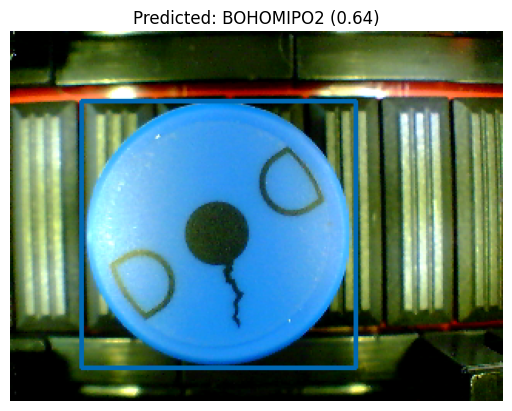

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step


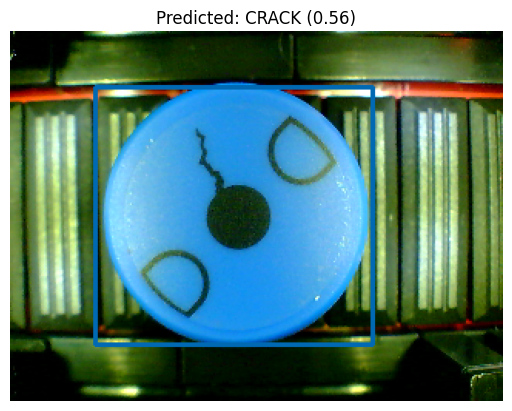

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


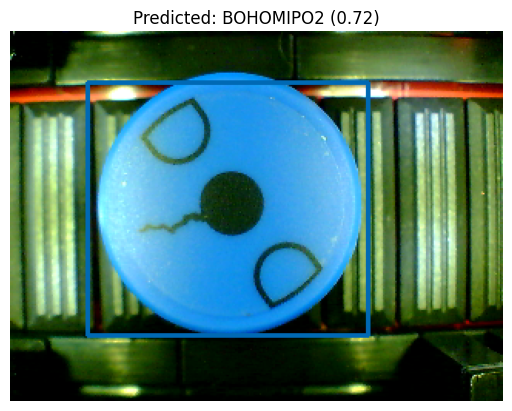

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


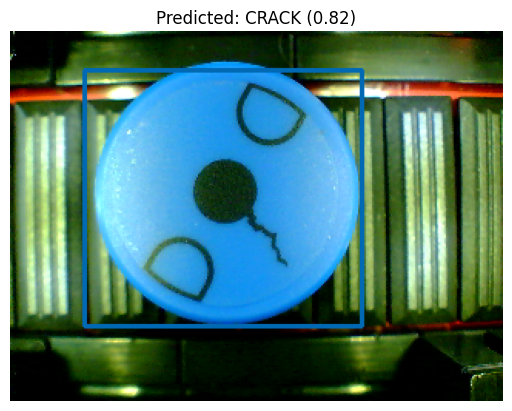

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


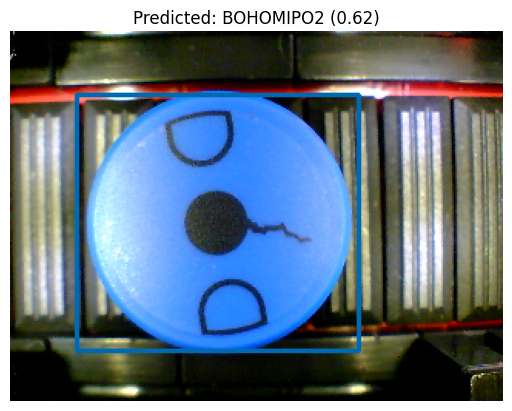

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


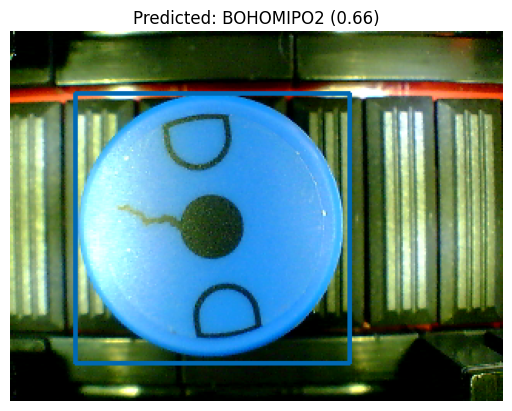

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


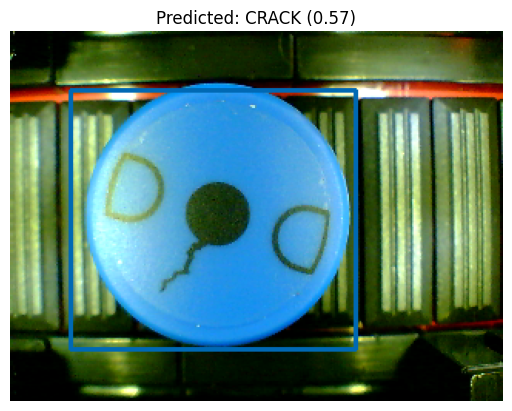

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


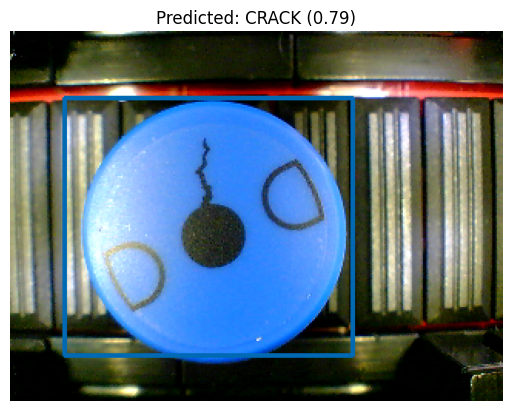

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


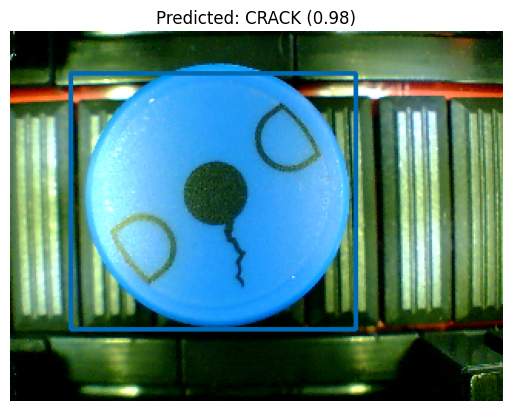

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


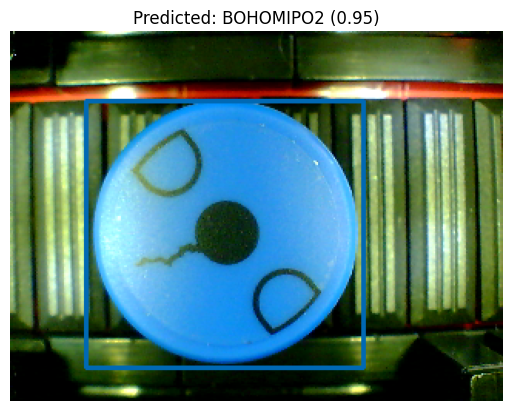

In [23]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image

# === CONFIGURATION ===
model_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\mobilenet_classifier.h5"  # Your trained model file
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"
unseen_images_dir = r"C:\Users\anar1\Downloads\JULIANIMAGES\OneDrive_2_6-19-2025"

# === Load class labels ===
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]

# === Load the model ===
model = tf.keras.models.load_model(model_path)

# === Helper function ===
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Make predictions and visualize ===
for file in os.listdir(unseen_images_dir):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(unseen_images_dir, file)
        
        # Preprocess & predict
        img_tensor = preprocess_image(img_path)
        preds = model.predict(img_tensor)
        pred_class = class_names[np.argmax(preds)]
        confidence = float(np.max(preds))
        
        # Load original image
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {pred_class} ({confidence:.2f})")
        plt.show()


# PREDICTIONS FOR BOHO WHITE

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


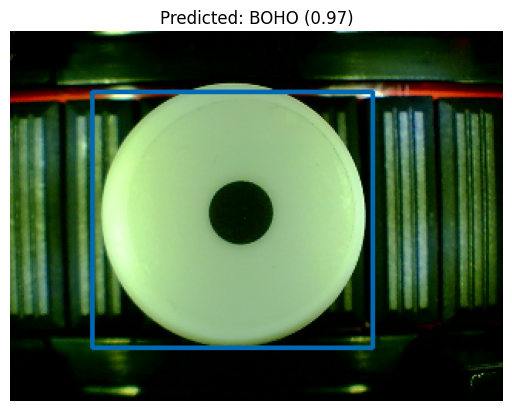

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


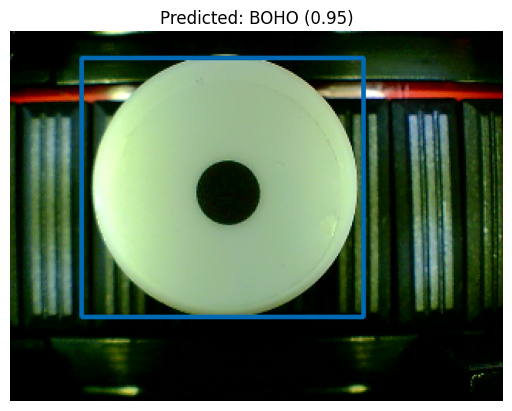

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


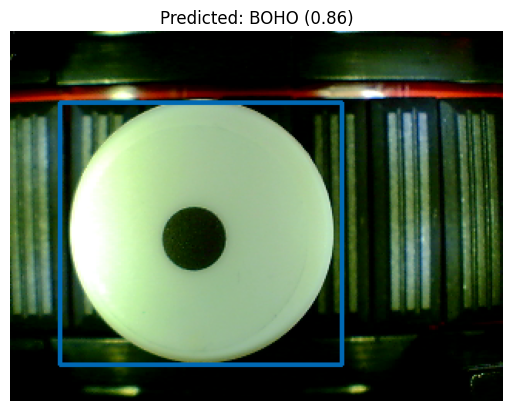

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


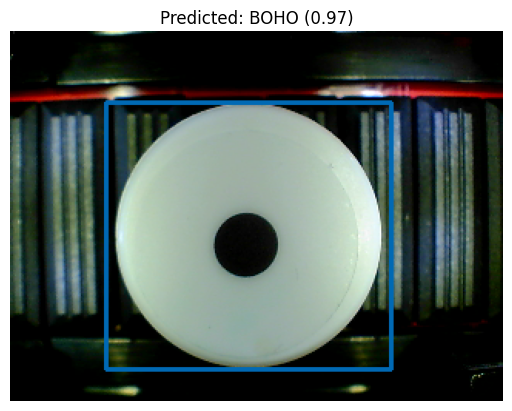

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


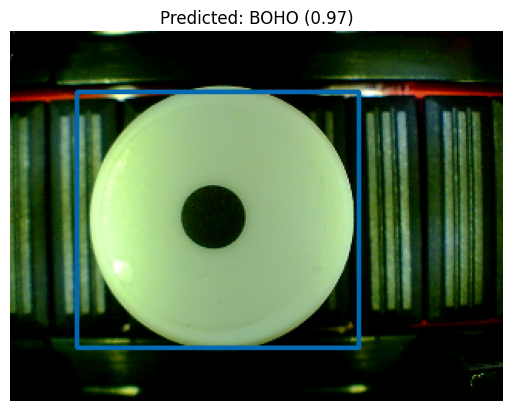

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


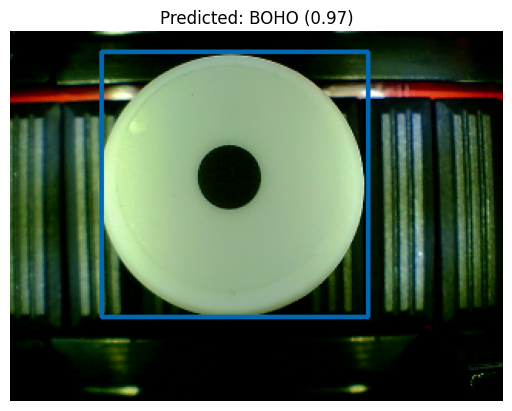

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


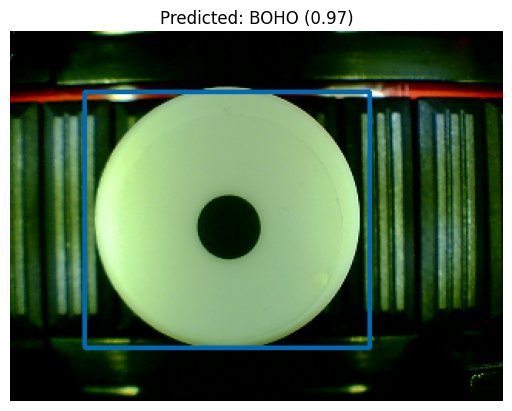

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


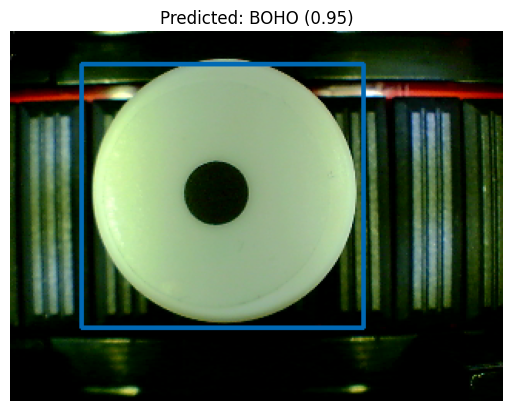

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


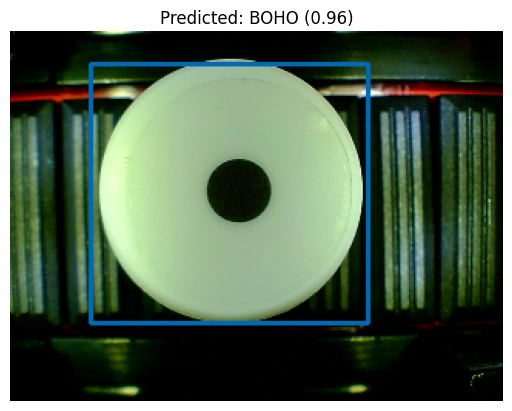

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


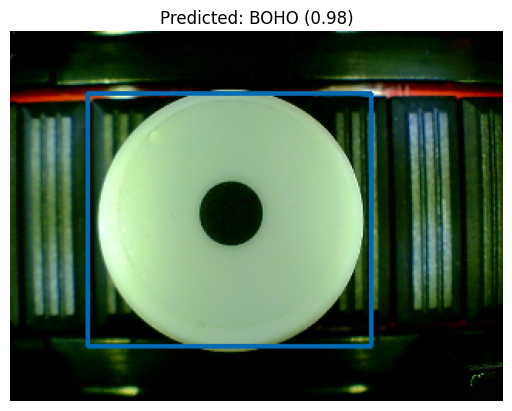

In [24]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image

# === CONFIGURATION ===
model_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\mobilenet_classifier.h5"  # Your trained model file
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"
unseen_images_dir = r"C:\Users\anar1\Downloads\JULIANIMAGES\OneDrive_3_6-19-2025"

# === Load class labels ===
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]

# === Load the model ===
model = tf.keras.models.load_model(model_path)

# === Helper function ===
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Make predictions and visualize ===
for file in os.listdir(unseen_images_dir):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(unseen_images_dir, file)
        
        # Preprocess & predict
        img_tensor = preprocess_image(img_path)
        preds = model.predict(img_tensor)
        pred_class = class_names[np.argmax(preds)]
        confidence = float(np.max(preds))
        
        # Load original image
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {pred_class} ({confidence:.2f})")
        plt.show()


# PREDICTIONS FOR BOHOMIPO2 BLUE

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


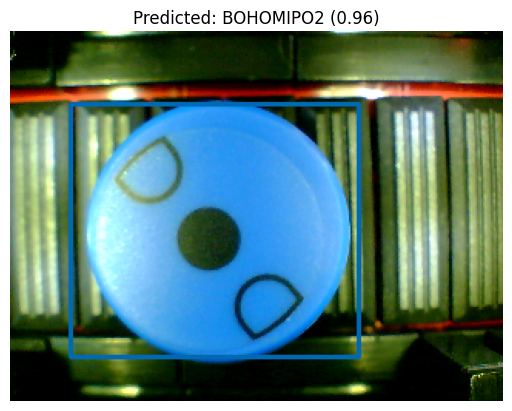

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


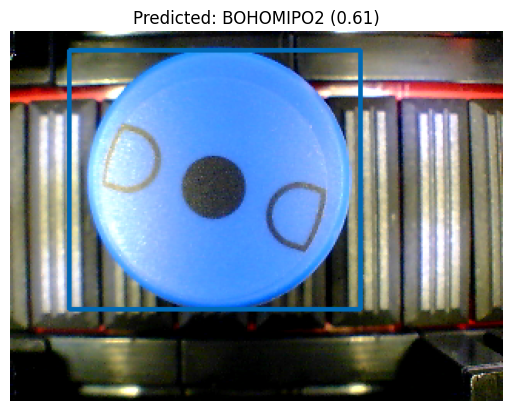

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


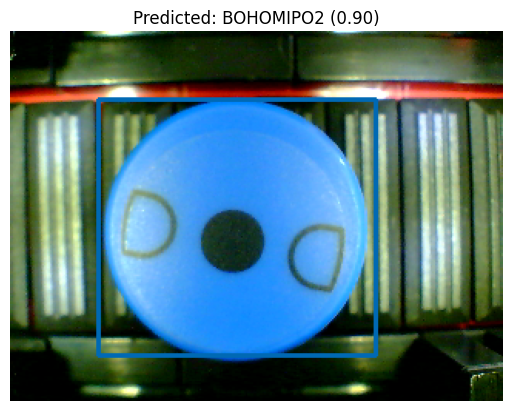

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


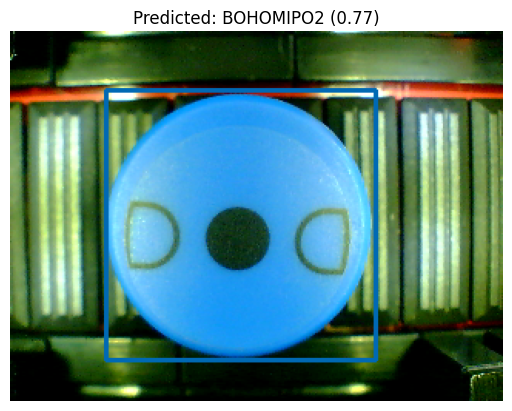

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


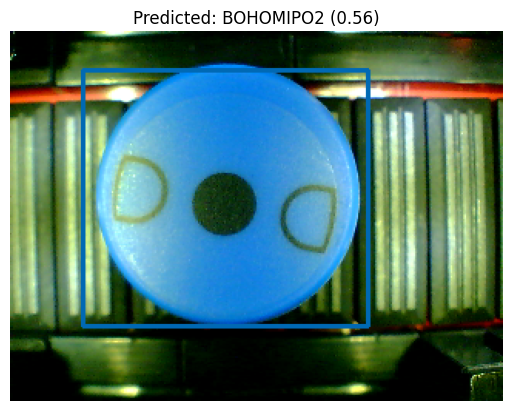

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


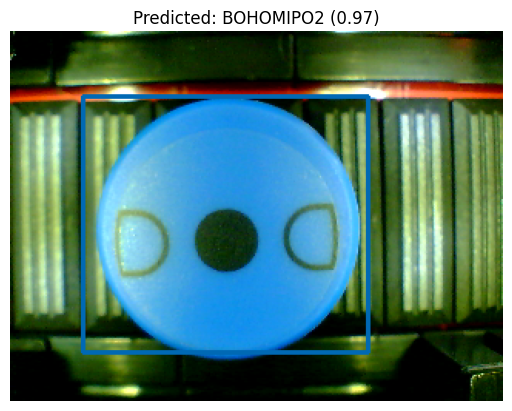

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


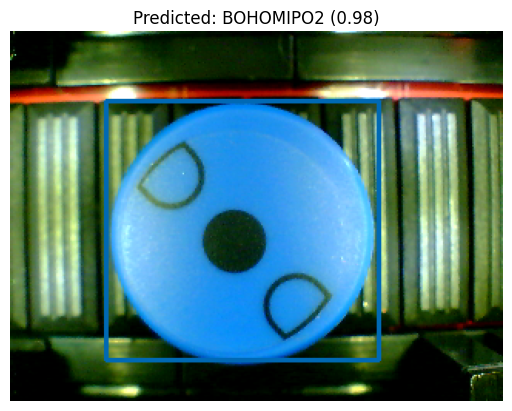

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


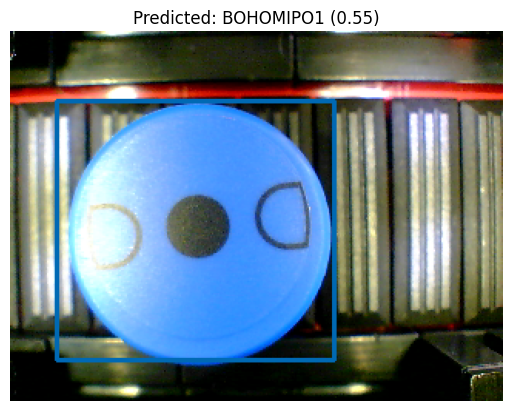

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


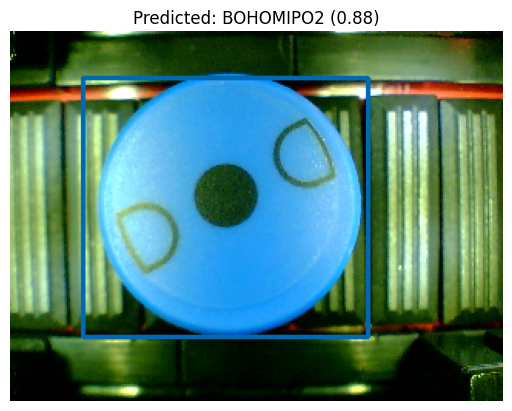

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


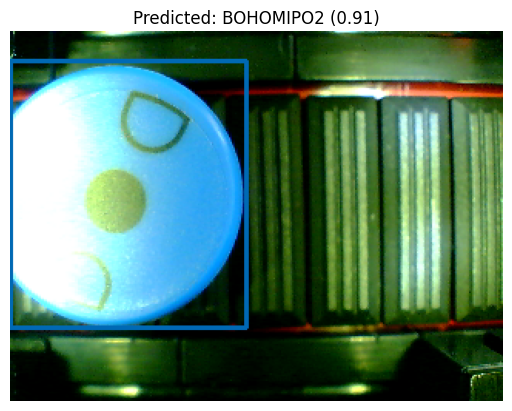

In [25]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image

# === CONFIGURATION ===
model_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\mobilenet_classifier.h5"  # Your trained model file
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"
unseen_images_dir = r"C:\Users\anar1\Downloads\JULIANIMAGES\OneDrive_4_6-19-2025"

# === Load class labels ===
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]

# === Load the model ===
model = tf.keras.models.load_model(model_path)

# === Helper function ===
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Make predictions and visualize ===
for file in os.listdir(unseen_images_dir):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(unseen_images_dir, file)
        
        # Preprocess & predict
        img_tensor = preprocess_image(img_path)
        preds = model.predict(img_tensor)
        pred_class = class_names[np.argmax(preds)]
        confidence = float(np.max(preds))
        
        # Load original image
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {pred_class} ({confidence:.2f})")
        plt.show()


# PREDICTIONS FOR CRACK WHITE

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


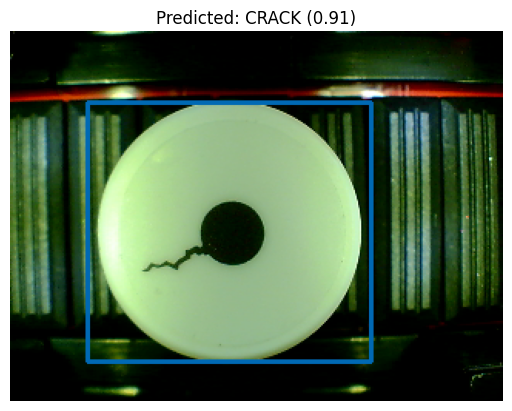

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


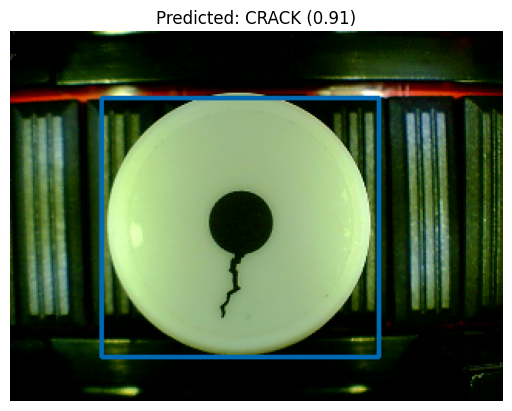

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


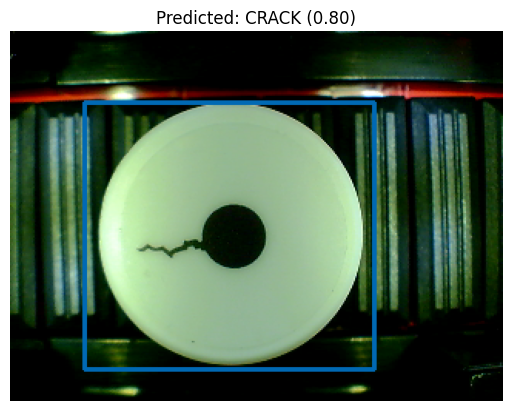

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


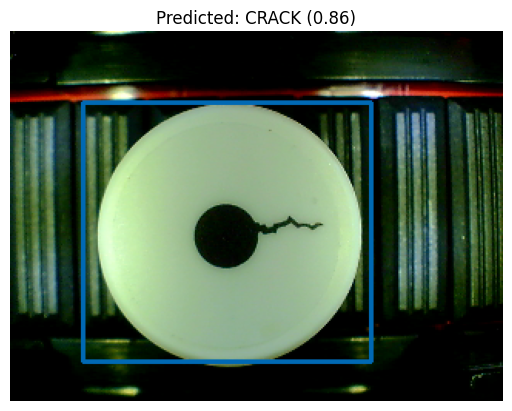

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


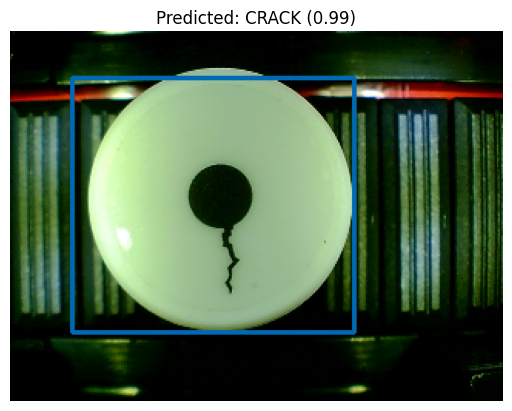

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


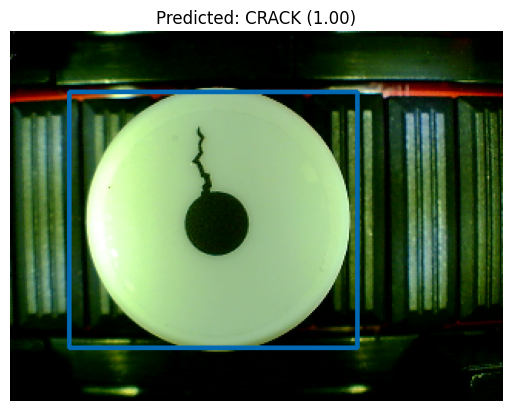

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


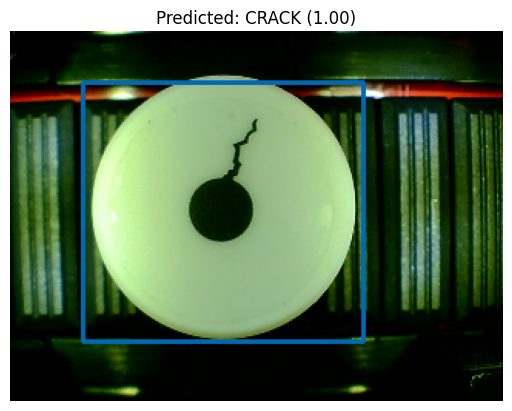

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


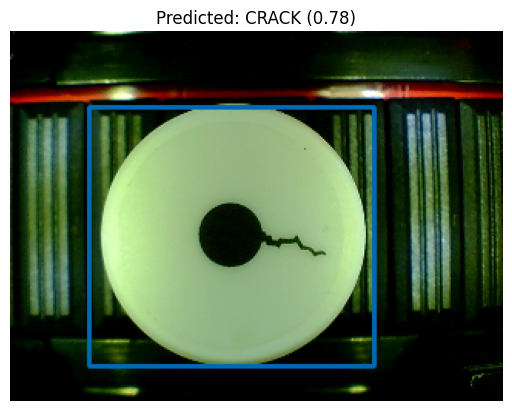

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


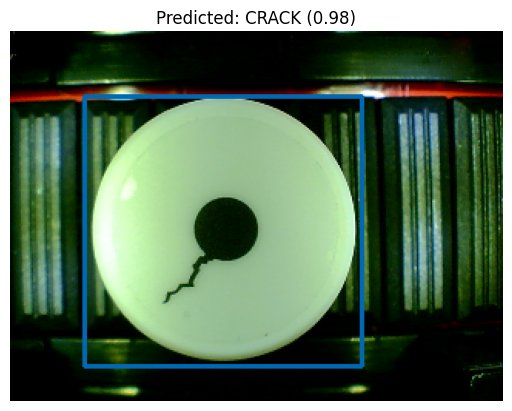

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


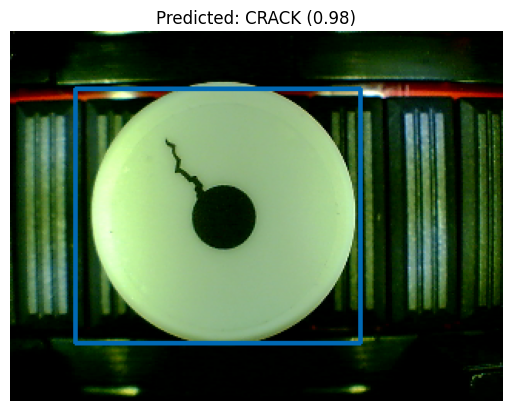

In [26]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from PIL import Image

# === CONFIGURATION ===
model_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\mobilenet_classifier.h5"  # Your trained model file
labels_path = r"C:\Users\anar1\Desktop\DIGITAL PROJECT\machine-learning-main\object-detection\source\sorting_line\NewMODELmobilenetSSD\h5\labels.txt"
unseen_images_dir = r"C:\Users\anar1\Downloads\JULIANIMAGES\OneDrive_5_6-19-2025"

# === Load class labels ===
with open(labels_path, "r") as f:
    class_names = [line.strip() for line in f.readlines()]

# === Load the model ===
model = tf.keras.models.load_model(model_path)

# === Helper function ===
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

# === Make predictions and visualize ===
for file in os.listdir(unseen_images_dir):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(unseen_images_dir, file)
        
        # Preprocess & predict
        img_tensor = preprocess_image(img_path)
        preds = model.predict(img_tensor)
        pred_class = class_names[np.argmax(preds)]
        confidence = float(np.max(preds))
        
        # Load original image
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {pred_class} ({confidence:.2f})")
        plt.show()
